<a href="https://colab.research.google.com/github/dxmai/CS116.M12.KHCL/blob/main/CS116_BT4_PCA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Thông tin sinh viên:

Họ và tên: Đặng Xuân Mai

MSSV: 19521820

#Principal component analysis (PCA) exercise#

##Assignment 1: Implement PCA from scratch##

Please implement PCA algorithm with the following guidelines:
- U_k, X_avg, Z = PCA (X, K), where X is the input data matrix (each column is a sample), K is the number of remained components after removing less important components. For the output, Uk is the matrix made by K basis vectors (u_1, u_2, ..., u_k), Z is the output data after removing redundant components. X_avg is the new origin.
- X_reconstruct = decode (U_k, X_avg, Z): restore the data (approximately) from U_k, X_avg, Z matrices.

###PCA Function

In [ ]:
import numpy as np
#Add libraries
from numpy.linalg import eig #Ref #1
from numpy import cov #Ref #1

def PCA(X, K):                                                                  #K is the number of new components                                                                            

  # Centering the data by subtracting the mean
  X_mean = np.mean(X, axis = 0)
  X_avg = X - X_mean #Ref #1
  
  # Calculate the covariance matrix                                       
  covariance_matrix = np.cov(X_avg, rowvar=False)                               #Calculate the covariance matrix

  #TODO: Calculate eigenvalues and eigenvectors
  eigen_values , eigen_vectors = eig(covariance_matrix)

  #TODO: Sort the eigenvalues in descending order
    #First, sort the values
  sorted_values_indices = np.argsort(-1*eigen_values) #Ref #2, 3, 6
    #Second, sort the vetors
  sorted_eigenvectors = eigen_vectors[:,sorted_values_indices] #Ref #3


  #TODO: Select the new basis and transform the data  
  U_k = sorted_eigenvectors[:, :K] #Ref #4, 7
  Z  = U_k.T.dot(X_avg.T) #Ref #1, 5
  Z = Z.T

  return U_k, X_mean, Z

Ref #:

1: https://machinelearningmastery.com/calculate-principal-component-analysis-scratch-python/

2: https://numpy.org/doc/stable/reference/generated/numpy.argsort.html

3: https://web.physics.utah.edu/~detar/lessons/python/numpy_eigen/node2.html

4: https://pythonexamples.org/python-numpy-get-specific-row-of-elements/

5: https://builtin.com/data-science/step-step-explanation-principal-component-analysis

6: https://www.kite.com/python/answers/how-to-use-numpy-argsort-in-descending-order-in-python#:~:text=Use%20negation%20of%20a%20NumPy,of%20an_array%20in%20descending%20order.

7: https://www.askpython.com/python/examples/principal-component-analysis

###Decode PCA Function

In [ ]:
def decode_PCA(U_k, X_avg, Z):

  #TODO: decode/restore the data before PCA step
  X_reconstruct =  Z.dot(U_k.T) + X_avg
  
  return X_reconstruct

Ref #: 

1: https://stats.stackexchange.com/questions/229092/how-to-reverse-pca-and-reconstruct-original-variables-from-several-principal-com

2: http://www.cs.otago.ac.nz/cosc453/student_tutorials/principal_components.pdf

Create dummy dataset and test the code yourself

Note: X and X_reconstruct MUST have the same shape (Please print out)

In [ ]:
import numpy as np
from random import randint

In [ ]:
#Create a random matrix's row and column first
rows = randint(5, 20)
columns = randint(5, 20)
print("Matrix ", rows, "x", columns) 

Matrix  13 x 5


In [ ]:
#Create a matrix with row x column
matrix = np.random.randint(10, size=(rows, columns))
matrix

array([[6, 9, 9, 3, 2],
       [6, 3, 1, 6, 3],
       [8, 4, 4, 9, 7],
       [6, 6, 8, 6, 2],
       [2, 8, 7, 2, 2],
       [5, 2, 4, 9, 7],
       [9, 0, 4, 5, 4],
       [6, 7, 5, 0, 8],
       [1, 4, 2, 5, 5],
       [3, 1, 2, 1, 4],
       [0, 9, 7, 0, 1],
       [7, 1, 1, 7, 5],
       [8, 9, 6, 6, 3]])

Ref: https://www.geeksforgeeks.org/how-to-create-a-matrix-of-random-integers-in-python/

In [ ]:
#Each column is a sample => Transpose matrix = data input is required (I understand the statement is that. I'm so sorry if I misunderstood something)
matrix = matrix.transpose()
matrix

array([[6, 6, 8, 6, 2, 5, 9, 6, 1, 3, 0, 7, 8],
       [9, 3, 4, 6, 8, 2, 0, 7, 4, 1, 9, 1, 9],
       [9, 1, 4, 8, 7, 4, 4, 5, 2, 2, 7, 1, 6],
       [3, 6, 9, 6, 2, 9, 5, 0, 5, 1, 0, 7, 6],
       [2, 3, 7, 2, 2, 7, 4, 8, 5, 4, 1, 5, 3]])

Ref: https://numpy.org/doc/stable/reference/generated/numpy.matrix.transpose.html

In [ ]:
#Create a random number of remained components
num = randint(1, max(rows, columns))
num 

2

In [ ]:
# TODO: Create dummy dataset and perform testing => Done
X = matrix
num_component = num

U_k, X_avg, Z = PCA(X, num_component)

In [ ]:
X_reconstruct = decode_PCA(U_k, X_avg, Z)

In [ ]:
#Check the shape of X and X_reconstruct
print("X shape is", X.shape)
print("X_reconstruct shape is", X_reconstruct.shape)
if X.shape[0] == X_reconstruct.shape[0] and X.shape[1] == X_reconstruct.shape[1]:
  print("Have the same shape")
else:
  print("Somthing wrong happened, check again")

X shape is (5, 13)
X_reconstruct shape is (5, 13)
Have the same shape


##Assignment 2: PCA for image compression##

In [ ]:
import cv2
import numpy as np
import urllib.request
from google.colab.patches import cv2_imshow

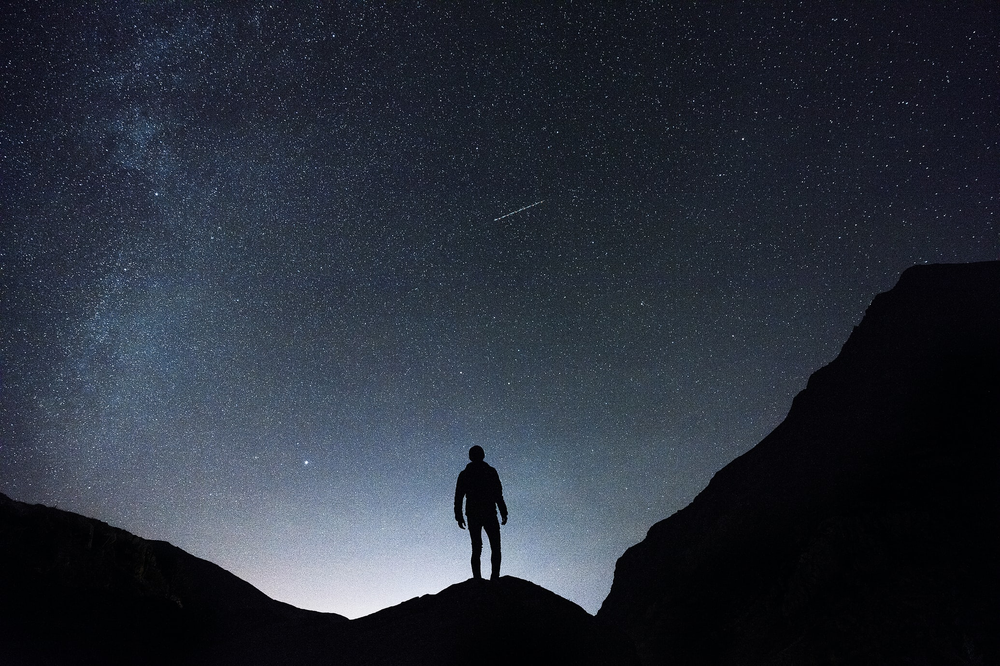

In [ ]:
req = urllib.request.urlopen('https://images.unsplash.com/photo-1483356256511-b48749959172?ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&ixlib=rb-1.2.1&auto=format&fit=crop&w=2070&q=80')
arr = np.asarray(bytearray(req.read()), dtype=np.uint8)
img = cv2.imdecode(arr, -1)
cv2_imshow(img)

In [ ]:
# Compress the image with K = 50
# You can test with other value of K. It is your choice :D
num_component = 50

# Split image channel
blue, green, red = cv2.split(img)

In [ ]:
# TODO: Perform image compression using functions given in Assignment 1
#The order is U_k, X_avg, Z
blue_compress  = PCA(blue, num_component)
green_compress = PCA(green, num_component)
red_compress   = PCA(red, num_component)

img_compressed = np.dstack((blue_compress[2], green_compress[2], red_compress[2]))

In [ ]:
img_compressed

array([[[-1.30415592e+03+0.j, -1.19641246e+03+0.j,  1.04553991e+03+0.j],
        [ 3.71001389e+02+0.j, -3.56533259e+02+0.j, -3.50309361e+02+0.j],
        [-7.38116727e+01+0.j,  1.02276947e+02+0.j,  1.14481630e+02+0.j],
        ...,
        [ 5.68713645e+00+0.j, -2.38760164e+01+0.j, -2.51991333e+01+0.j],
        [ 1.10315162e+01+0.j, -8.40128849e-01+0.j,  2.90338025e+01+0.j],
        [ 1.70402130e+00+0.j,  8.98116146e+00+0.j, -1.30814782e+01+0.j]],

       [[-1.33179591e+03+0.j, -1.22497692e+03+0.j,  1.07598063e+03+0.j],
        [ 3.48763020e+02+0.j, -3.32815943e+02+0.j, -3.28559012e+02+0.j],
        [-8.26574341e+01+0.j,  1.07903565e+02+0.j,  1.17197528e+02+0.j],
        ...,
        [ 6.76737011e+00+0.j, -7.35061648e+00+0.j, -3.61161744e+01+0.j],
        [ 1.30061932e+01+0.j,  1.68802628e+01+0.j,  3.15513758e+01+0.j],
        [ 3.65328771e+00+0.j,  2.23568439e+00+0.j,  4.05466036e+01+0.j]],

       [[-1.30747118e+03+0.j, -1.20491780e+03+0.j,  1.06141421e+03+0.j],
        [ 3.08110624e

In [ ]:
#Scale back to 0 - 255 range
img_compressed = np.array(img_compressed,dtype=np.uint8)

In [ ]:
img_compressed

array([[[232,  84,  21],
        [115, 156, 162],
        [183, 102, 114],
        ...,
        [  5, 233, 231],
        [ 11,   0,  29],
        [  1,   8, 243]],

       [[205,  56,  51],
        [ 92, 180, 184],
        [174, 107, 117],
        ...,
        [  6, 249, 220],
        [ 13,  16,  31],
        [  3,   2,  40]],

       [[229,  76,  37],
        [ 52, 215, 221],
        [145, 132, 146],
        ...,
        [ 30,  23,  28],
        [244, 235, 251],
        [ 13, 239,  47]],

       ...,

       [[166, 162,  33],
        [157,  99, 179],
        [ 75, 216, 226],
        ...,
        [255,   5, 255],
        [  2, 255, 253],
        [  4,   0,   0]],

       [[163, 159,  36],
        [158,  98, 178],
        [ 76, 215, 226],
        ...,
        [  0,   7,   0],
        [  5, 255, 252],
        [  5,   0,   2]],

       [[165, 160,  34],
        [156,  99, 179],
        [ 76, 215, 225],
        ...,
        [255,  10, 254],
        [  7,   0, 251],
        [  2,   0,   4]]

In [ ]:
cv2.imwrite("image_compressed.jpg", img_compressed)

True

In [ ]:
#Decode image
blue_decode = decode_PCA(blue_compress[0], blue_compress[1], blue_compress[2])
green_decode = decode_PCA(green_compress[0], green_compress[1], green_compress[2])
red_decode = decode_PCA(red_compress[0], red_compress[1], red_compress[2])

In [ ]:
#Scale into range (0, 255)
blue_decode = np.array(blue_decode,dtype=np.uint8)
green_decode = np.array(green_decode,dtype=np.uint8)
red_decode = np.array(red_decode,dtype=np.uint8)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: ComplexWarning: Casting complex values to real discards the imaginary part
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: ComplexWarning: Casting complex values to real discards the imaginary part
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: ComplexWarning: Casting complex values to real discards the imaginary part
  after removing the cwd from sys.path.


In [ ]:
img_reduced= (cv2.merge((blue_decode, green_decode, red_decode)))

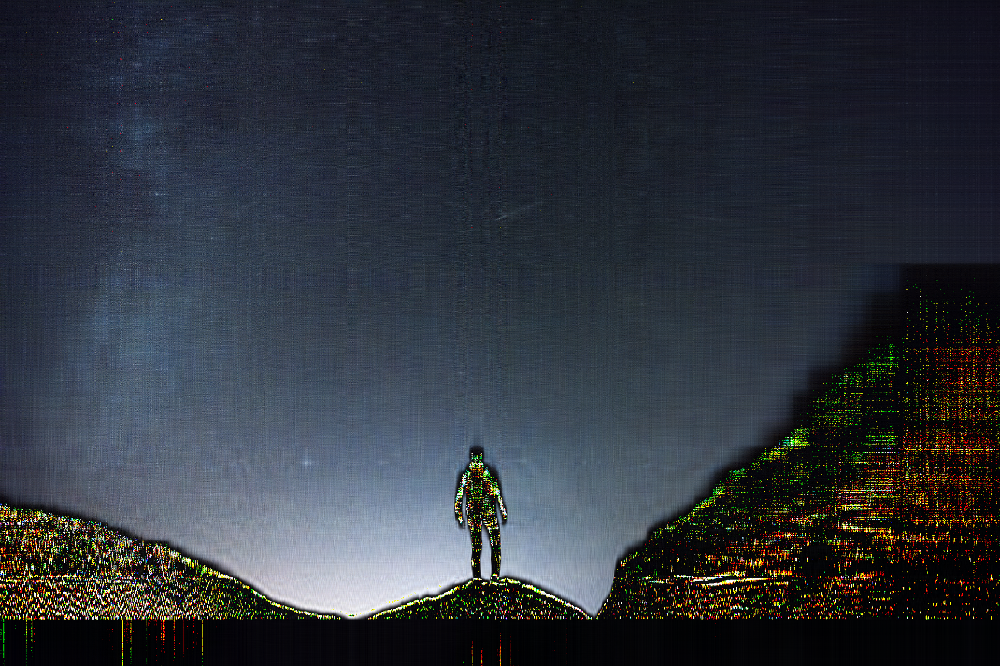

In [ ]:
cv2_imshow(img_reduced)

In [ ]:
#Save the decode_image
cv2.imwrite("image_decode.jpg", img_reduced)

True

Ref: https://www.geeksforgeeks.org/python-opencv-cv2-imwrite-method/

##Assignment 3: PCA for sound compression##


In [ ]:
# Download a random online WAV sound file
# Save the file with name "test.wav"
!wget -O test.wav https://file-examples-com.github.io/uploads/2017/11/file_example_WAV_1MG.wav

--2021-10-13 03:42:44--  https://file-examples-com.github.io/uploads/2017/11/file_example_WAV_1MG.wav
Resolving file-examples-com.github.io (file-examples-com.github.io)... 185.199.109.153, 185.199.110.153, 185.199.111.153, ...
Connecting to file-examples-com.github.io (file-examples-com.github.io)|185.199.109.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1073218 (1.0M) [audio/wav]
Saving to: ‘test.wav’

test.wav            100%[===================>]   1.02M  --.-KB/s    in 0.06s   

2021-10-13 03:42:44 (16.3 MB/s) - ‘test.wav’ saved [1073218/1073218]



In [ ]:
import numpy as np
from scipy.io.wavfile import read, write 

# Read the WAV file
WAV = read("test.wav")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: WavFileWarning: Chunk (non-data) not understood, skipping it.
  """


In [ ]:
#Get the true data
sound = np.array(WAV[1],dtype=int)

Ref: https://stackoverflow.com/questions/16778878/python-write-a-wav-file-into-numpy-float-array

In [ ]:
sound

array([[ -114,    23],
       [ -241,     3],
       [ -285,   -29],
       ...,
       [ -772, -1059],
       [ -422,  -840],
       [ -787,  -314]])

In [ ]:
# TODO: Perform sound compression using functions given in Assignment 1
#PCA
num_component = 50
WAV_compress  = PCA(sound, num_component)

In [ ]:
#Get the Z - matrix after using PCA
sound_array = np.asarray(WAV_compress[2], dtype=np.int16)

Ref: https://www.geeksforgeeks.org/how-to-convert-a-list-and-tuple-into-numpy-arrays/

In [ ]:
#Get the sample rate of the source file
sample_rate = WAV[0]
sample_rate

8000

Ref: https://docs.scipy.org/doc/scipy/reference/generated/scipy.io.wavfile.read.html

In [ ]:
# TODO: Save the compressed sound file with name "result.wav"
# Hint: Using scipy library
write("result.wav", sample_rate, sound_array)

In [ ]:
#Decode PCA
sound_decode = read("result.wav")
sound = np.array(sound_decode[1],dtype=int)

decode  = decode_PCA(WAV_compress[0], WAV_compress[1], WAV_compress[2])

sound_array = np.asarray(decode, dtype=np.int16)

In [ ]:
write("result_decode.wav", sample_rate, sound_array)

##To do:##
Please write down your comments on PCA for image and sound compression

###Your answer goes here:###

After compressing image and sound with the num_componet = 50, the reconstructed products are having some differences with the orgins

1. The image's color has changed, and it leads to the problem is the decode_image doesn't look too good.

2. The sound file is better than image a bit, after using PCA and decode. 


* The result.wav file (using PCA), has about 8 crack sound in total 33 seconds

* After using the decode_PCA function, the result_decode.wav file has no crack sound anymore. I found it's very similar to the orgin file.


  
  

  

#Submission note:#

*   You must keep the cells' output.
*   You must submit the original image/sound and the compressed image/sound file in the attachment.



Image

* The original file: "image_origin.jfif"
* The compressed file: "image_compressed.jpg"
* The decoded file: "image_decode.jpg"

Sound

* The original file: "test.wav"
* The compressed file: "result.wav"
* The decoded file: "result_decode.wav"